# Modeling (Primary: LightGBM) + Optuna Tuning
# モデリング（主要モデル：LightGBM）＋ Optuna 最適化

**EN**

This notebook implements a complete v1.0 screening pipeline.

The workflow includes:

- Leakage-safe train / validation / test split
- Cross-validated hyperparameter optimization (Optuna) on training data only
- Final model training on the full training set
- Decision threshold selection on validation data
- Final unbiased evaluation on the test set
- Export of reproducible model artifacts (pipeline + threshold)

The objective is to establish a stable and reproducible baseline model
suitable for screening-oriented deployment.


**JP**

本ノートブックでは、v1.0 として再現可能なスクリーニング用学習パイプラインを構築する。

主な構成：

- リーク対策済みの Train / Validation / Test 分割
- Train 内 CV による Optuna ハイパーパラメータ最適化
- 学習データ全体での最終モデル再学習
- Validation による判定閾値選択
- Test データでの最終評価（閾値固定）
- 再現可能なモデル成果物（パイプライン＋閾値）の保存

目的は、スクリーニング用途に適した
安定かつ再現可能な基準モデルを確立することである。


## 0. Imports & Config / インポートと設定

In [1]:
from pathlib import Path
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import optuna
import shap

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import precision_recall_curve

from sklearn.metrics import (
    roc_auc_score, average_precision_score,
    precision_recall_curve,
    precision_score, recall_score, f1_score,
    classification_report, confusion_matrix
)

from lightgbm import LGBMClassifier
import joblib

RANDOM_STATE = 17
ARTIFACT_DIR = Path("../models")
ARTIFACT_DIR.mkdir(exist_ok=True)

## 1. Load Data & Define Target (Leakage-Safe) / データ読み込みと目的変数定義（リーケージ対策）

**EN**

We load the dataset and define the binary target as PHQ-9 ≥ 10.

Because the target is directly derived from PHQ-9, all PHQ-9 / GAD-7 scores and severity labels are removed from the feature set to prevent label leakage.

We also drop `User_ID` as an identifier without predictive meaning.

**JP**

データを読み込み、PHQ-9 ≥ 10 を基準として2値目的変数を定義する。

目的変数は PHQ-9 スコアから直接生成されるため、PHQ-9 / GAD-7 のスコアおよび重症度ラベルはラベルリーケージ防止のため特徴量から除外する。

また、`User_ID` は識別子であり予測情報を持たないため削除する。

In [2]:
df = pd.read_csv("../data/raw/social_media_mental_health.csv").copy()

df["target"] = (df["PHQ_9_Score"] >= 10).astype(int)

LEAK_COLS = ["PHQ_9_Score", "PHQ_9_Severity", "GAD_7_Score", "GAD_7_Severity"]
DROP_COLS = LEAK_COLS + ["target", "User_ID"]

X = df.drop(columns=DROP_COLS)
y = df["target"]

print("Rows:", len(df))
print("Target rate:", round(y.mean(), 4))
print("X shape:", X.shape)

Rows: 8000
Target rate: 0.2092
X shape: (8000, 10)


## 2. Train–Test Split / 学習・評価データ分割

**EN**

We use a three-way split:

- Train: model fitting and cross-validation
- Validation: operating threshold selection
- Test: final unbiased evaluation (fully held out)

The validation set is used exclusively for threshold tuning, while the test set remains untouched until final reporting.


**JP**

3分割を採用する：

- Train：モデル学習および交差検証
- Validation：判定閾値（オペレーティングポイント）の選択
- Test：最終評価（完全ホールドアウト）

Validation は閾値調整のみに使用し、Test データは最終報告まで使用しない。

In [3]:
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE
)

X_train, X_valid, y_train, y_valid = train_test_split(
    X_train_full, y_train_full, test_size=0.2, stratify=y_train_full, random_state=RANDOM_STATE
)

print("Train rate:", round(y_train.mean(), 4))
print("Valid rate:", round(y_valid.mean(), 4))
print("Test  rate:", round(y_test.mean(), 4))

joblib.dump(X_train_full.index, ARTIFACT_DIR / "train_full_index.joblib")
joblib.dump(X_test.index, ARTIFACT_DIR / "test_index.joblib")

Train rate: 0.2092
Valid rate: 0.2094
Test  rate: 0.2094


['..\\models\\test_index.joblib']

## 3. Preprocessor + Pipeline Factory / 前処理とパイプライン生成

**EN**

We build a preprocessing transformer and a pipeline factory.

- Numeric features are passed through without scaling.
- Categorical/boolean features are one-hot encoded.
- The model is trained inside a scikit-learn Pipeline to prevent preprocessing leakage.

**JP**

前処理（数値・カテゴリ処理）とモデルを scikit-learn Pipeline として構成する。

- 数値特徴量はスケーリングせずそのまま使用する
- カテゴリ／真偽値は One-Hot 化する
- 前処理を Pipeline 内で学習させ、前処理リーケージを防ぐ

In [4]:
def make_preprocessor(X: pd.DataFrame) -> ColumnTransformer:
    num_cols = X.select_dtypes(include=["int64", "float64", "int32", "float32", "bool"]).columns.tolist()
    cat_cols = X.select_dtypes(include=["object", "category"]).columns.tolist()

    return ColumnTransformer(
        transformers=[
            ("num", "passthrough", num_cols),
            ("cat", OneHotEncoder(handle_unknown="ignore"), cat_cols),
        ],
        remainder="drop",
    )

def make_lgbm_pipeline(params: dict, X_ref: pd.DataFrame) -> Pipeline:
    preprocessor = make_preprocessor(X_ref)

    clf = LGBMClassifier(
        objective="binary",
        random_state=RANDOM_STATE,
        n_jobs=-1,
        class_weight="balanced",
        **params,
    )
    return Pipeline([("prep", preprocessor), ("clf", clf)])

**EN**

Column lists are derived from the training split and reused across splits.

**JP**

列定義は学習データで確定し、valid/test でも同じ定義を使用する。

## 4. Metric Helpers / 評価指標ヘルパー

**EN**

Utility functions for probability-based metrics and threshold selection.
Threshold tuning is performed on the validation set only.

**JP**

確率出力に基づく評価指標と、判定閾値選択のためのヘルパー関数。
閾値調整は Validation データのみで行う。

In [5]:
def proba_metrics(y_true, proba) -> dict:
    return {
        "roc_auc": roc_auc_score(y_true, proba),
        "pr_auc": average_precision_score(y_true, proba),
    }

def eval_at_threshold(y_true, proba, thr: float) -> dict:
    pred = (proba >= thr).astype(int)
    return {
        "threshold": float(thr),
        "precision": precision_score(y_true, pred, zero_division=0),
        "recall": recall_score(y_true, pred, zero_division=0),
        "f1": f1_score(y_true, pred, zero_division=0),
    }

def pick_threshold_max_f1(y_true, proba) -> float:
    p, r, t = precision_recall_curve(y_true, proba)

    # p and r have length len(t)+1; align f1 with thresholds t
    f1 = 2 * p[:-1] * r[:-1] / (p[:-1] + r[:-1] + 1e-12)

    idx = int(np.argmax(f1))
    return float(t[idx])

## 5. Hyperparameter Optimization (Optuna, CV) / ハイパーパラメータ最適化（Optuna・CV）

In [6]:
study = optuna.create_study(
    direction="maximize",
    sampler=optuna.samplers.TPESampler(seed=RANDOM_STATE),
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=2),
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

def optuna_objective(trial) -> float:
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 1500),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 16, 128),
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 120),
        "subsample": trial.suggest_float("subsample", 0.7, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.7, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 5.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 5.0, log=True),
    }


    scores = []
    for fold, (tr_idx, va_idx) in enumerate(cv.split(X_train_full, y_train_full), start=1):
        X_tr = X_train_full.iloc[tr_idx]
        y_tr = y_train_full.iloc[tr_idx]
        X_va = X_train_full.iloc[va_idx]
        y_va = y_train_full.iloc[va_idx]

        model = make_lgbm_pipeline(params, X_tr)
        model.fit(X_tr, y_tr)

        proba = model.predict_proba(X_va)[:, 1]
        score = average_precision_score(y_va, proba)
        scores.append(score)

        interim = float(np.mean(scores))
        trial.report(interim, step=fold)
        if trial.should_prune():
            raise optuna.TrialPruned()

    return float(np.mean(scores))

study.optimize(optuna_objective, n_trials=40)

[I 2026-03-04 23:15:22,631] A new study created in memory with name: no-name-97ec7168-d8b3-400a-868f-dffcc45c234a


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 1071, number of negative: 4049
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 376
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:

[I 2026-03-04 23:15:55,444] Trial 0 finished with value: 0.5190571870078274 and parameters: {'n_estimators': 653, 'learning_rate': 0.0490127741307512, 'num_leaves': 37, 'min_child_samples': 17, 'subsample': 0.936095637999974, 'colsample_bytree': 0.8969000565327566, 'reg_alpha': 0.003513784735245459, 'reg_lambda': 0.0010166051540040609}. Best is trial 0 with value: 0.5190571870078274.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 1071, number of negative: 4049
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 376
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:

[I 2026-03-04 23:16:34,197] Trial 1 finished with value: 0.5232475160624592 and parameters: {'n_estimators': 346, 'learning_rate': 0.0292096418718935, 'num_leaves': 122, 'min_child_samples': 16, 'subsample': 0.9592126310638633, 'colsample_bytree': 0.9631871578444091, 'reg_alpha': 2.7882528940392347e-08, 'reg_lambda': 0.004735544981583051}. Best is trial 1 with value: 0.5232475160624592.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1071, number of negative: 4049
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 376
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[Lig

[I 2026-03-04 23:16:46,214] Trial 2 finished with value: 0.4993968569413584 and parameters: {'n_estimators': 962, 'learning_rate': 0.059893909945788616, 'num_leaves': 70, 'min_child_samples': 41, 'subsample': 0.7893177154905314, 'colsample_bytree': 0.8684526715979083, 'reg_alpha': 2.7874351128039406e-05, 'reg_lambda': 0.07259117328002543}. Best is trial 1 with value: 0.5232475160624592.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 1071, number of negative: 4049
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 376
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Numb

[I 2026-03-04 23:16:51,563] Trial 3 finished with value: 0.5348904575166392 and parameters: {'n_estimators': 802, 'learning_rate': 0.015389457741377632, 'num_leaves': 33, 'min_child_samples': 16, 'subsample': 0.9154111581110937, 'colsample_bytree': 0.7876952063512416, 'reg_alpha': 5.359545372747839e-07, 'reg_lambda': 0.17061209775865205}. Best is trial 3 with value: 0.5348904575166392.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:17:03,126] Trial 4 finished with value: 0.5244277418887895 and parameters: {'n_estimators': 982, 'learning_rate': 0.012797539643601693, 'num_leaves': 77, 'min_child_samples': 27, 'subsample': 0.903028715710888, 'colsample_bytree': 0.735541679463723, 'reg_alpha': 7.430318518284009e-05, 'reg_lambda': 0.5303133487959584}. Best is trial 3 with value: 0.5348904575166392.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:17:13,634] Trial 5 finished with value: 0.5354789132575147 and parameters: {'n_estimators': 1257, 'learning_rate': 0.012258642067626193, 'num_leaves': 124, 'min_child_samples': 83, 'subsample': 0.9156328249673304, 'colsample_bytree': 0.923073029540229, 'reg_alpha': 0.5277058355895786, 'reg_lambda': 1.4628147959529163e-07}. Best is trial 5 with value: 0.5354789132575147.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:17:19,785] Trial 6 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 1071, number of negative: 4049
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 376
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


[I 2026-03-04 23:17:20,765] Trial 7 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:17:33,331] Trial 8 finished with value: 0.532080614748192 and parameters: {'n_estimators': 1361, 'learning_rate': 0.01048144640159609, 'num_leaves': 105, 'min_child_samples': 95, 'subsample': 0.9616131357859512, 'colsample_bytree': 0.9748330259168666, 'reg_alpha': 2.4093103815967447e-06, 'reg_lambda': 1.138340868249577e-06}. Best is trial 5 with value: 0.5354789132575147.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is no

[I 2026-03-04 23:17:34,622] Trial 9 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-04 23:17:39,080] Trial 10 finished with value: 0.5536021848730707 and parameters: {'n_estimators': 1467, 'learning_rate': 0.025087386355076326, 'num_leaves': 81, 'min_child_samples': 110, 'subsample': 0.7109253993089663, 'colsample_bytree': 0.703095613749687, 'reg_alpha': 3.9243896913022955, 'reg_lambda': 4.877584493354524e-08}. Best is trial 10 with value: 0.5536021848730707.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:17:43,597] Trial 11 finished with value: 0.5539124146831369 and parameters: {'n_estimators': 1478, 'learning_rate': 0.02420153828983201, 'num_leaves': 80, 'min_child_samples': 119, 'subsample': 0.7099281171563997, 'colsample_bytree': 0.702174079382711, 'reg_alpha': 4.618010456306614, 'reg_lambda': 1.0958438633379377e-08}. Best is trial 11 with value: 0.5539124146831369.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-04 23:17:47,446] Trial 12 finished with value: 0.5554072251370733 and parameters: {'n_estimators': 1500, 'learning_rate': 0.024703337999416302, 'num_leaves': 75, 'min_child_samples': 110, 'subsample': 0.7032651802298081, 'colsample_bytree': 0.7007141448441232, 'reg_alpha': 4.7754193295131495, 'reg_lambda': 1.2355783449863462e-08}. Best is trial 12 with value: 0.5554072251370733.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-04 23:17:52,936] Trial 13 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-04 23:17:59,209] Trial 14 finished with value: 0.5452930686471693 and parameters: {'n_estimators': 1119, 'learning_rate': 0.02073351233210644, 'num_leaves': 92, 'min_child_samples': 102, 'subsample': 0.7573256124141874, 'colsample_bytree': 0.7155607273898263, 'reg_alpha': 2.699260915620471, 'reg_lambda': 2.8794635472470106e-06}. Best is trial 12 with value: 0.5554072251370733.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-04 23:18:02,365] Trial 15 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:09,554] Trial 16 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:14,573] Trial 17 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:18,107] Trial 18 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000486 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-04 23:18:20,542] Trial 19 finished with value: 0.5545281413109084 and parameters: {'n_estimators': 1483, 'learning_rate': 0.06412163111568923, 'num_leaves': 68, 'min_child_samples': 105, 'subsample': 0.9972264663093946, 'colsample_bytree': 0.7013527306691677, 'reg_alpha': 4.369457759486213, 'reg_lambda': 2.647671110195662e-07}. Best is trial 12 with value: 0.5554072251370733.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:22,663] Trial 20 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-04 23:18:25,029] Trial 21 finished with value: 0.5495223163115839 and parameters: {'n_estimators': 1476, 'learning_rate': 0.0846178286367787, 'num_leaves': 86, 'min_child_samples': 111, 'subsample': 0.7247982906763648, 'colsample_bytree': 0.7017644296977549, 'reg_alpha': 3.7050769638991317, 'reg_lambda': 2.1369247060354324e-08}. Best is trial 12 with value: 0.5554072251370733.


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:29,283] Trial 22 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:32,126] Trial 23 finished with value: 0.553640948253866 and parameters: {'n_estimators': 1441, 'learning_rate': 0.03505110406424713, 'num_leaves': 101, 'min_child_samples': 110, 'subsample': 0.7851105308334664, 'colsample_bytree': 0.7344911110857919, 'reg_alpha': 4.849742792357561, 'reg_lambda': 1.0700346580030908e-08}. Best is trial 12 with value: 0.5554072251370733.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-04 23:18:35,296] Trial 24 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:40,505] Trial 25 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:44,124] Trial 26 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:47,707] Trial 27 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:18:52,905] Trial 28 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-04 23:18:55,150] Trial 29 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:19:00,780] Trial 30 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:19:03,780] Trial 31 finished with value: 0.5536694329348204 and parameters: {'n_estimators': 1447, 'learning_rate': 0.038210164879842655, 'num_leaves': 107, 'min_child_samples': 113, 'subsample': 0.7896172503678255, 'colsample_bytree': 0.7239337671189634, 'reg_alpha': 4.036377931354982, 'reg_lambda': 1.3812711731573254e-08}. Best is trial 12 with value: 0.5554072251370733.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2026-03-04 23:19:06,687] Trial 32 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-04 23:19:12,410] Trial 33 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:19:16,146] Trial 34 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:19:18,480] Trial 35 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-04 23:19:24,864] Trial 36 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:19:26,953] Trial 37 finished with value: 0.5560785609602836 and parameters: {'n_estimators': 1208, 'learning_rate': 0.07156942873747252, 'num_leaves': 72, 'min_child_samples': 106, 'subsample': 0.9417065343798696, 'colsample_bytree': 0.7353967348267603, 'reg_alpha': 4.955303090047646, 'reg_lambda': 2.2530585692042258e-08}. Best is trial 37 with value: 0.5560785609602836.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-04 23:19:30,416] Trial 38 pruned. 


[LightGBM] [Info] Number of positive: 1072, number of negative: 4048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2026-03-04 23:19:31,376] Trial 39 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [7]:
print("Best CV PR-AUC:", study.best_value)
print("Best params:", study.best_params)

Best CV PR-AUC: 0.5560785609602836
Best params: {'n_estimators': 1208, 'learning_rate': 0.07156942873747252, 'num_leaves': 72, 'min_child_samples': 106, 'subsample': 0.9417065343798696, 'colsample_bytree': 0.7353967348267603, 'reg_alpha': 4.955303090047646, 'reg_lambda': 2.2530585692042258e-08}


**EN**

Although EDA showed strong univariate separation, the tuned multivariate model achieves PR-AUC ≈ 0.56.
Given the positive rate (~0.21), this indicates meaningful predictive signal, but far from perfect discrimination.

This suggests that the signal is real yet noisy and likely limited by the available feature set.

**JP**

EDAでは強い単変量の分離が見られたが、多変量モデルのPR-AUCは約0.56であった。
陽性率（約0.21）を踏まえると、予測シグナルは十分に有意だが、完全な識別には程遠い。

これは、シグナル自体は存在するもののノイズが大きく、
利用可能な特徴量の範囲では性能に上限がある可能性を示唆する。

## 6. Final Model Training / 最終モデル学習

In [8]:
best_params = study.best_params
final_model = make_lgbm_pipeline(best_params, X_train_full)
final_model.fit(X_train_full, y_train_full)

valid_proba = final_model.predict_proba(X_valid)[:, 1]
test_proba = final_model.predict_proba(X_test)[:, 1]

print("VALID:", proba_metrics(y_valid, valid_proba))
print("TEST :", proba_metrics(y_test, test_proba))

[LightGBM] [Info] Number of positive: 1339, number of negative: 5061
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 6400, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

**EN**

The final model achieves PR-AUC ≈ 0.60 on the test set, substantially above the baseline prevalence (~0.21).

Validation and test performance are closely aligned, indicating stable generalization without evident overfitting.

**JP**

最終モデルのテストPR-AUCは約0.60であり、陽性率（約0.21）を大きく上回る。

Validation と Test の性能が近く、過学習の兆候は見られない。

In [9]:
prep = final_model.named_steps["prep"]
model = final_model.named_steps["clf"]

In [10]:
X_valid_transformed = prep.transform(X_valid)

In [11]:
feature_names = prep.get_feature_names_out()

In [12]:
explainer = shap.TreeExplainer(model)

In [13]:
shap_values = explainer(X_valid_transformed)

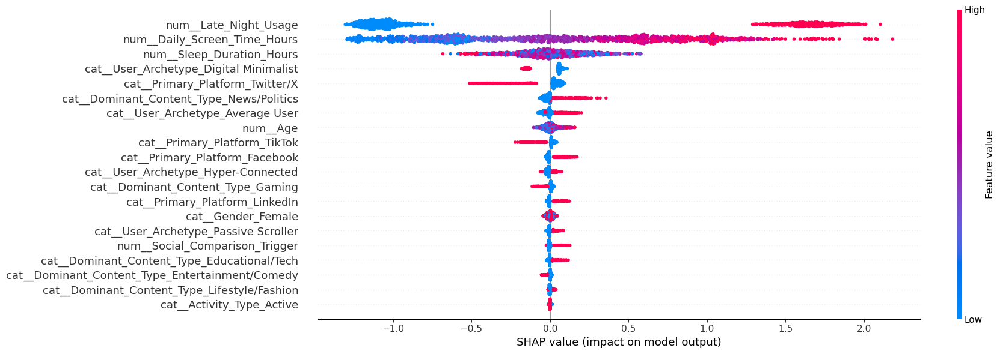

In [14]:
shap.summary_plot(
    shap_values,
    X_valid_transformed,
    feature_names=feature_names,
    plot_size=(18, 6)
)

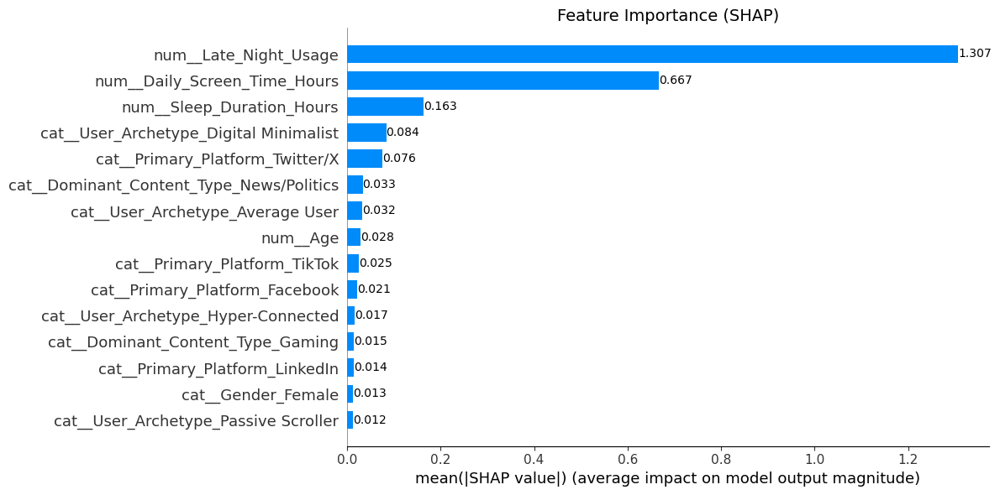

In [15]:
plt.figure(figsize=(14,8))

shap.summary_plot(
    shap_values,
    X_valid_transformed,
    feature_names=feature_names,
    plot_type="bar",
    max_display=15,
    plot_size=(12, 6),
    show=False
)

ax = plt.gca()
ax.bar_label(ax.containers[0], fmt="%.3f")

plt.title("Feature Importance (SHAP)", fontsize=14)
plt.tight_layout()
plt.show()

**EN**

Late-night device usage and longer daily screen time strongly increase the predicted depression risk, while longer sleep duration reduces it.\
User archetypes contribute additional signal, whereas demographic variables (age, gender) have relatively small influence on the predictions.


**JP**

深夜のデバイス使用や長いスクリーンタイムはうつリスクの予測を強く押し上げ、一方で睡眠時間が長いほどリスクは低くなる傾向が見られる。\
ユーザーの利用タイプ（Archetype）も一定の影響を持つが、年齢や性別などの人口統計的要因の影響は比較的小さい。

## 7. Decision Threshold Selection & Final Test Evaluation / 判定閾値の決定と最終評価

In [16]:
thr = pick_threshold_max_f1(y_valid, valid_proba)
print("Selected threshold (from VALID):", thr)

print("VALID @thr:", eval_at_threshold(y_valid, valid_proba, thr))

test_pred = (test_proba >= thr).astype(int)
print("TEST @thr:", eval_at_threshold(y_test, test_proba, thr))
print("\nClassification report (TEST):")
print(classification_report(y_test, test_pred, digits=3, zero_division=0))
print("\nConfusion matrix (TEST):")
print(confusion_matrix(y_test, test_pred))

Selected threshold (from VALID): 0.662599623480529
VALID @thr: {'threshold': 0.662599623480529, 'precision': 0.5068181818181818, 'recall': 0.832089552238806, 'f1': 0.6299435028248588}
TEST @thr: {'threshold': 0.662599623480529, 'precision': 0.5148148148148148, 'recall': 0.8298507462686567, 'f1': 0.6354285714285715}

Classification report (TEST):
              precision    recall  f1-score   support

           0      0.946     0.793     0.863      1265
           1      0.515     0.830     0.635       335

    accuracy                          0.801      1600
   macro avg      0.731     0.811     0.749      1600
weighted avg      0.856     0.801     0.815      1600


Confusion matrix (TEST):
[[1003  262]
 [  57  278]]


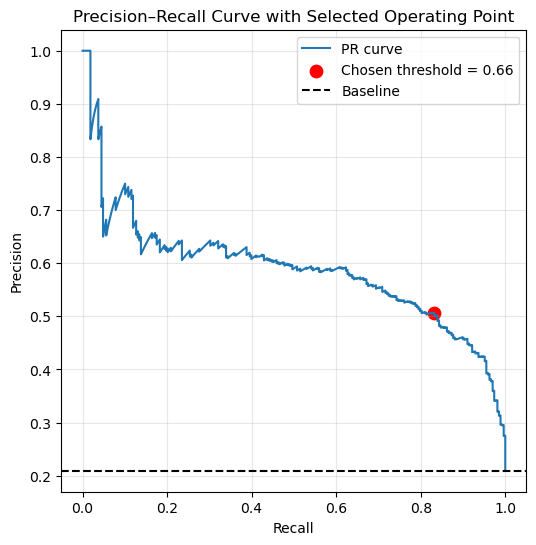

In [17]:
p, r, t = precision_recall_curve(y_valid, valid_proba)

# F1 for every threshold
f1 = 2 * p[:-1] * r[:-1] / (p[:-1] + r[:-1] + 1e-12)

best_idx = np.argmax(f1)
best_thr = t[best_idx]

best_p = p[best_idx]
best_r = r[best_idx]

plt.figure(figsize=(6,6))

plt.plot(r, p, label="PR curve")
plt.scatter(best_r, best_p, color="red", s=80,
            label=f"Chosen threshold = {best_thr:.2f}")

plt.axhline(y=y_valid.mean(), linestyle="--", label="Baseline", color="black")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve with Selected Operating Point")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

**EN**

The decision threshold is selected on the validation set by maximizing F1-score.

The chosen threshold (≈0.66) yields:

- Test Recall ≈ 0.83
- Test Precision ≈ 0.51
- Test F1 ≈ 0.64

Validation and test performance are closely aligned, indicating stable generalization.

This operating point prioritizes risk detection while maintaining moderate precision, which is appropriate for screening scenarios.

**JP**

判定閾値は Validation データ上で F1 を最大化するよう選択した。

選択された閾値（約0.66）において：

- Test Recall ≈ 0.83
- Test Precision ≈ 0.51
- Test F1 ≈ 0.64

Validation と Test の性能はほぼ一致しており、安定した汎化性能が確認できる。

本閾値はリスク検出を優先しつつ、一定の精度を維持するスクリーニング用途に適した設定である。

## 8. Model Artifact Serialization / モデル成果物の保存

In [18]:
# Extract the actual columns used by the fitted preprocessor
prep = final_model.named_steps["prep"]
num_cols_used = list(prep.transformers_[0][2])
cat_cols_used = list(prep.transformers_[1][2])

artifact = {
    "pipeline": final_model,
    "threshold": float(thr),
    "best_params": best_params,
    "meta": {
        "random_state": RANDOM_STATE,
        "drop_cols": DROP_COLS,
        "num_cols": num_cols_used,
        "cat_cols": cat_cols_used,
        "objective": "average_precision_cv",
    },
}

# Save a single binary artifact for inference
joblib.dump(artifact, ARTIFACT_DIR / "model_artifact.joblib")

# Save a lightweight JSON meta for quick inspection
meta_json = {
    "threshold": float(thr),
    "best_params": best_params,
    "random_state": RANDOM_STATE,
    "drop_cols": DROP_COLS,
    "num_cols": num_cols_used,
    "cat_cols": cat_cols_used,
}

with open(ARTIFACT_DIR / "model_artifact_meta.json", "w", encoding="utf-8") as f:
    json.dump(meta_json, f, ensure_ascii=False, indent=2)

print("Saved:", ARTIFACT_DIR / "model_artifact.joblib")
print("Saved:", ARTIFACT_DIR / "model_artifact_meta.json")

Saved: ..\models\model_artifact.joblib
Saved: ..\models\model_artifact_meta.json


## 9 Conclusions / まとめ

**EN**

- LightGBM (sklearn API), tuned via Optuna, is selected as the primary v1.0 model.
- Hyperparameters were optimized using 5-fold CV with PR-AUC as the objective.
- The final model achieves PR-AUC ≈ 0.60 on the test set (baseline ≈ 0.21).
- A decision threshold (≈0.66) was selected on the validation set, yielding:
  - Test Recall ≈ 0.83
  - Test Precision ≈ 0.51
- Validation and test performance are closely aligned, indicating stable generalization.
- The full inference artifact (pipeline + threshold + metadata) is saved for reproducibility.


**JP**

- Optuna によりチューニングした LightGBM（sklearn API）を v1.0 の主要モデルとして採用した。
- PR-AUC を目的関数とする 5-fold CV によりハイパーパラメータを最適化した。
- 最終モデルのテストPR-AUCは約0.60（ベースライン約0.21）を達成した。
- 判定閾値（約0.66）は validation で選択し、テストでは：
  - Recall ≈ 0.83
  - Precision ≈ 0.51
- Validation と Test の性能は近く、安定した汎化性能が確認された。
- 推論の再現性確保のため、パイプラインと閾値を成果物として保存した。
